In [ ]:
!pip install --no-deps build123d

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 198.3/198.3 kB 4.5 MB/s eta 0:00:00


In [ ]:
!pip install trianglesolver anytree ocpsvg ezdxf

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.9/44.9 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.9/44.9 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.0/143.0 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.9/137.9 kB 11.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
build123d 0.8.0 requires py-lib3mf>=2.3.1, which is not installed.
build123d 0.8.0 requires svgpathtools<2,>=1.5.1, which is not installed.
build123d 0.8.0 requires ipython<9,>=8.0.0, but you have ipython 7.34.0 which is incompatible.


In [ ]:
!pip install svgpathtools py-lib3mf

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.4/67.4 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 39.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.1/67.1 kB 6.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
build123d 0.8.0 requires ipython<9,>=8.0.0, but you have ipython 7.34.0 which is incompatible.


In [ ]:
from build123d import *


In [ ]:
box = Box(10,10,10)
box

Box at 0x7865996413f0, label(), #children(0)

In [ ]:
!pip install k3d
!jupyter nbextension install --py --user k3d
!jupyter nbextension enable --py --user k3d


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.1/23.1 MB 48.7 MB/s eta 0:00:00
Installing /usr/local/lib/python3.10/dist-packages/k3d/static -> k3d
Making directory: /root/.local/share/jupyter/nbextensions/k3d/
Copying: /usr/local/lib/python3.10/dist-packages/k3d/static/index.js.map -> /root/.local/share/jupyter/nbextensions/k3d/index.js.map
Copying: /usr/local/lib/python3.10/dist-packages/k3d/static/fflate.js -> /root/.local/share/jupyter/nbextensions/k3d/fflate.js
Copying: /usr/local/lib/python3.10/dist-packages/k3d/static/standalone.js -> /root/.local/share/jupyter/nbextensions/k3d/standalone.js
Copying: /usr/local/lib/python3.10/dist-packages/k3d/static/require.js -> /root/.local/share/jupyter/nbextensions/k3d/require.js
Copying: /usr/local/lib/python3.10/dist-packages/k3d/static/extension.js -> /root/.local/share/jupyter/nbextensions/k3d/extension.js
Copying: /usr/local/lib/python3.10/dist-packages/k3d/static/index.js -> /root/.local/share/jupyter/nbextensions/k3d/index.js
Copying

In [ ]:
import k3d
from google.colab import output

output.enable_custom_widget_manager()

k3d.switch_to_text_protocol()

In [ ]:
import k3d
import numpy as np

# Define vertices for a cube
vertices = np.array([
    [-1, -1, -1],  # Bottom face
    [ 1, -1, -1],
    [ 1,  1, -1],
    [-1,  1, -1],
    [-1, -1,  1],  # Top face
    [ 1, -1,  1],
    [ 1,  1,  1],
    [-1,  1,  1]
], dtype=np.float32)

# Define triangular faces of the cube (each face has two triangles)
indices = np.array([
    [0, 1, 2], [0, 2, 3],  # Bottom face
    [4, 5, 6], [4, 6, 7],  # Top face
    [0, 1, 5], [0, 5, 4],  # Front face
    [1, 2, 6], [1, 6, 5],  # Right face
    [2, 3, 7], [2, 7, 6],  # Back face
    [3, 0, 4], [3, 4, 7]   # Left face
], dtype=np.uint32)

# Create a K3D plot
plot = k3d.plot()

# Add the cube mesh to the plot
cube_mesh = k3d.mesh(vertices, indices, color=0xffa500, side='double')  # Ensure both sides of the triangles are rendered
plot += cube_mesh

# Set camera position and zoom
plot.camera_auto_fit = True

# Display the plot
plot.display()


Output()

In [ ]:
from io import BytesIO
import warnings
from os import PathLike, fsdecode, fspath
from typing import Union

from build123d.build_common import UNITS_PER_METER
from build123d.build_enums import PrecisionMode, Unit
from build123d.geometry import Location
from build123d.topology import Compound, Curve, Part, Shape, Sketch

from OCP.BRepMesh import BRepMesh_IncrementalMesh
from OCP.StlAPI import StlAPI_Writer




def export_stl_my(
    to_export: Shape,
    file_path: Union[PathLike, str, bytes],
    tolerance: float = 1e-3,
    angular_tolerance: float = 0.1,
    ascii_format: bool = False,
) -> bool:
    """Export STL

    Exports a shape to a specified STL file.

    Args:
        to_export (Shape): object or assembly
        file_path (str): The path and file name to write the STL output to.
        tolerance (float, optional): A linear deflection setting which limits the distance
            between a curve and its tessellation. Setting this value too low will result in
            large meshes that can consume computing resources. Setting the value too high can
            result in meshes with a level of detail that is too low. The default is a good
            starting point for a range of cases. Defaults to 1e-3.
        angular_tolerance (float, optional): Angular deflection setting which limits the angle
            between subsequent segments in a polyline. Defaults to 0.1.
        ascii_format (bool, optional): Export the file as ASCII (True) or binary (False)
            STL format. Defaults to False (binary).

    Returns:
        bool: Success
    """
    mesh = BRepMesh_IncrementalMesh(
        to_export.wrapped, tolerance, True, angular_tolerance, True
    )
    mesh.Perform()

    writer = StlAPI_Writer()

    writer.ASCIIMode = ascii_format



    return writer.Write(to_export.wrapped, file_path)

In [ ]:
import tempfile
import os

with tempfile.NamedTemporaryFile(delete=False) as tmp:
  export_stl_my(box, tmp.name)
  # need size of tmp file
  print(os.path.getsize(tmp.name))

684


In [ ]:
!pip install numpy-stl

import k3d
import numpy as np
from stl import mesh

# Load the STL file
my_mesh = mesh.Mesh.from_file(tmp.name)

# Create a K3D plot
plot = k3d.plot()

# Prepare data for plotting
vertices = np.vstack((my_mesh.v0, my_mesh.v1, my_mesh.v2))
indices = np.arange(len(vertices)).reshape(-1, 3)

# Add the mesh to the plot
mesh_plot = k3d.mesh(vertices.astype(np.float32), indices, color=0xffa500)
plot += mesh_plot

# Display the plot
plot.display()


Output()

In [ ]:
print(box.to_vtk_poly_data(normals=True))


vtkPolyData (0x5cb8f7c48450)
  Debug: Off
  Modified Time: 20991
  Reference Count: 1
  Registered Events: (none)
  Information: 0x5cb8f70bd3c0
  Data Released: False
  Global Release Data: Off
  UpdateTime: 20998
  Field Data:
    Debug: Off
    Modified Time: 20981
    Reference Count: 1
    Registered Events: (none)
    Number Of Arrays: 0
    Number Of Components: 0
    Number Of Tuples: 0
  Number Of Points: 0
  Number Of Cells: 0
  Cell Data:
    Debug: Off
    Modified Time: 20989
    Reference Count: 1
    Registered Events: 
      Registered Observers:
        vtkObserver (0x5cb8f5d00890)
          Event: 33
          EventName: ModifiedEvent
          Command: 0x5cb8f6fbf730
          Priority: 0
          Tag: 1
    Number Of Arrays: 0
    Number Of Components: 0
    Number Of Tuples: 0
    Copy Tuple Flags: ( 1 1 1 1 1 0 1 1 1 1 1 1 )
    Interpolate Flags: ( 1 1 1 1 1 0 0 1 1 1 1 0 )
    Pass Through Flags: ( 1 1 1 1 1 1 1 1 1 1 1 1 )
    Scalars: (none)
    Vectors: (none

In [ ]:
!pip install vtk

In [ ]:
import k3d
import os
import vtk
import numpy as np

from k3d.helpers import download

filename = download('https://raw.githubusercontent.com/naucoin/VTKData/master/Data/cow.vtp')

model_matrix = (
     1.0,  0.0, 0.0, 0.0,
     0.0,  0.0, 1.0, 0.0,
     0.0,  1.0, 0.0, 0.0,
     0.0,  0.0, 0.0, 1.0
)

reader = vtk.vtkXMLPolyDataReader()
reader.SetFileName(filename)
reader.Update()

plot = k3d.plot()
cow3d = k3d.vtk_poly_data(reader.GetOutput(), color=0xff0000, model_matrix=model_matrix)
plot += cow3d
plot.display()

Output()

In [ ]:
from vtkmodules.vtkIOXML import vtkXMLPolyDataWriter

def to_vtkpoly_string(
    shape,tolerance: float = 1e-3, angular_tolerance: float = 0.1
) -> str:
    """to_vtkpoly_string

    Args:
        shape (Shape): object to convert
        tolerance (float, optional): Defaults to 1e-3.
        angular_tolerance (float, optional): Defaults to 0.1.

    Raises:
        ValueError: not a valid Shape

    Returns:
        str: vtkpoly str
    """
    if not hasattr(shape, "wrapped"):
        raise ValueError(f"Type {type(shape)} is not supported")

    writer = vtkXMLPolyDataWriter()
    writer.SetWriteToOutputString(True)
    writer.SetInputData(shape.to_vtk_poly_data(tolerance, angular_tolerance, True))
    writer.Write()

    return writer.GetOutputString()



In [ ]:
import vtk
import k3d
import tempfile

# Example VTK XML content (replace with your data)
vtk_xml_content = """<?xml version="1.0"?>
<VTKFile type="PolyData" version="0.1" byte_order="LittleEndian">
    <PolyData>
        <Piece NumberOfPoints="4" NumberOfPolys="2">
            <Points>
                <DataArray type="Float32" NumberOfComponents="3" format="ascii">
                    0 0 0  1 0 0  1 1 0  0 1 0
                </DataArray>
            </Points>
            <Polys>
                <DataArray type="Int32" Name="connectivity" format="ascii">
                    0 1 2  0 2 3
                </DataArray>
                <DataArray type="Int32" Name="offsets" format="ascii">
                    3 6
                </DataArray>
            </Polys>
        </Piece>
    </PolyData>
</VTKFile>
"""

# Write the XML content to a temporary file
with tempfile.NamedTemporaryFile(suffix=".vtp", delete=False) as temp_file:
    temp_file.write(vtk_xml_content.encode('UTF-8'))
    temp_file_path = temp_file.name

# Load the temporary file using vtkXMLPolyDataReader
reader = vtk.vtkXMLPolyDataReader()
reader.SetFileName(temp_file_path)
reader.Update()

# Get the output as a VTK PolyData
polydata = reader.GetOutput()

# Use k3d.vtk_poly_data to directly display the VTK PolyData
plot = k3d.plot()
vtk_mesh = k3d.vtk_poly_data(polydata)
plot += vtk_mesh
plot.display()

# Optional: Clean up the temporary file
import os
os.remove(temp_file_path)


Output()

In [ ]:
print(reader.GetOutput())

vtkPolyData (0x5cb8f6fa1d30)
  Debug: Off
  Modified Time: 27101
  Reference Count: 2
  Registered Events: (none)
  Information: 0x5cb8f7104de0
  Data Released: False
  Global Release Data: Off
  UpdateTime: 27104
  Field Data:
    Debug: Off
    Modified Time: 27007
    Reference Count: 1
    Registered Events: (none)
    Number Of Arrays: 0
    Number Of Components: 0
    Number Of Tuples: 0
  Number Of Points: 4
  Number Of Cells: 2
  Cell Data:
    Debug: Off
    Modified Time: 27015
    Reference Count: 1
    Registered Events: 
      Registered Observers:
        vtkObserver (0x5cb8f767b9c0)
          Event: 33
          EventName: ModifiedEvent
          Command: 0x5cb8f7d0bd60
          Priority: 0
          Tag: 1
    Number Of Arrays: 0
    Number Of Components: 0
    Number Of Tuples: 0
    Copy Tuple Flags: ( 1 1 1 1 1 0 1 1 1 1 1 1 )
    Interpolate Flags: ( 1 1 1 1 1 0 0 1 1 1 1 0 )
    Pass Through Flags: ( 1 1 1 1 1 1 1 1 1 1 1 1 )
    Scalars: (none)
    Vectors: (none

In [ ]:
import vtk
from io import StringIO

# Example XML PolyData content
xml_content = """<?xml version="1.0"?>
<VTKFile type="PolyData" version="0.1" byte_order="LittleEndian">
  <PolyData>
    <Piece NumberOfPoints="0" NumberOfVerts="0" NumberOfLines="0" NumberOfStrips="0" NumberOfPolys="0">
    </Piece>
  </PolyData>
</VTKFile>
"""

# Use StringIO to simulate a file
xml_data = StringIO(xml_content)

# Write the StringIO content to a temporary file
import tempfile

with tempfile.NamedTemporaryFile(delete=False, suffix=".vtp") as temp_file:
    temp_file.write(xml_data.getvalue().encode())
    temp_file_path = temp_file.name

# Read the temporary file using vtkXMLPolyDataReader
reader = vtk.vtkXMLPolyDataReader()
reader.SetFileName(temp_file_path)
reader.Update()



# Get the output polydata
polydata = reader.GetOutput()
print(f"Number of points: {polydata.GetNumberOfPoints()}")



# Clean up the temporary file
import os
os.remove(temp_file_path)


Number of points: 0


In [ ]:
import tempfile

box = Cylinder(radius=10, height=30)
cube = to_vtkpoly_string(box)

xmldata = StringIO(cube)

with tempfile.NamedTemporaryFile(delete=False, suffix=".vtp") as tmp:
  tmp.write(xmldata.getvalue().encode())
  tmpfilename = tmp.name

reader = vtk.vtkXMLPolyDataReader()
reader.SetFileName(tmpfilename)
reader.Update()

polydata = reader.GetOutput()
print(f"Number of points: {polydata.GetNumberOfPoints()}")
print(reader.GetOutputAsDataSet())

import os
os.remove(tmpfilename)

Number of points: 0
vtkPolyData (0x5cb8f7d7ce70)
  Debug: Off
  Modified Time: 28328
  Reference Count: 2
  Registered Events: (none)
  Information: 0x5cb8f7700640
  Data Released: False
  Global Release Data: Off
  UpdateTime: 28329
  Field Data:
    Debug: Off
    Modified Time: 28273
    Reference Count: 1
    Registered Events: (none)
    Number Of Arrays: 0
    Number Of Components: 0
    Number Of Tuples: 0
  Number Of Points: 0
  Number Of Cells: 0
  Cell Data:
    Debug: Off
    Modified Time: 28281
    Reference Count: 1
    Registered Events: 
      Registered Observers:
        vtkObserver (0x5cb8f7097700)
          Event: 33
          EventName: ModifiedEvent
          Command: 0x5cb8f6f52330
          Priority: 0
          Tag: 1
    Number Of Arrays: 0
    Number Of Components: 0
    Number Of Tuples: 0
    Copy Tuple Flags: ( 1 1 1 1 1 0 1 1 1 1 1 1 )
    Interpolate Flags: ( 1 1 1 1 1 0 0 1 1 1 1 0 )
    Pass Through Flags: ( 1 1 1 1 1 1 1 1 1 1 1 1 )
    Scalars: (none

In [ ]:
plot = k3d.plot()
cow = k3d.vtk_poly_data(polydata, color=0xff0000, model_matrix=model_matrix)
plot += cow
plot.display()

Output()

In [ ]:
!pip install trimesh[all] pythreejs

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 43.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 271.7/271.7 kB 19.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 58.7 MB/s eta 0:00:00


In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

In [ ]:
import trimesh
from build123d import *
import tempfile
import k3d


box = Box(10,10,10)

with tempfile.NamedTemporaryFile(delete=False, suffix=".stl") as trimeshbox:
  export_stl(box, trimeshbox.name)
  mesh = trimesh.load(trimeshbox.name)
  plot = k3d.plot()
  k3dmesh = k3d.mesh(mesh.vertices, mesh.faces)
  plot += k3dmesh
  plot.display()


  #print(stl.is_watertight)
  # Extract vertex and face data




  # Create a mesh using the geometry


  # Set up scene, camera, and renderer



  # Dis


#delete trimeshbox
#import os

#os.remove(trimeshbox.name)






/usr/local/lib/python3.10/dist-packages/traittypes/traittypes.py:97: UserWarning: Given trait value dtype "float64" does not match required type "float32". A coerced copy has been created.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/traittypes/traittypes.py:97: UserWarning: Given trait value dtype "int64" does not match required type "uint32". A coerced copy has been created.
  warnings.warn(


Output()

Support for third party widgets will remain active for the duration of the session. To disable support:

In [ ]:
from google.colab import output
output.disable_custom_widget_manager()

In [ ]:
import trimesh
import numpy as np

def points_to_spheres(points, radius=1):
    """
    Convert points into spheres for notebook-friendly display
    """
    return [
        trimesh.primitives.Sphere(radius=radius, center=pt) for pt in points
    ]


# Similar example as above
v = np.random.random((1000,3))
p = points_to_spheres(v, radius=0.01)

s = trimesh.Scene()
s.add_geometry(trimesh.creation.axis())
s.add_geometry(p)
s.show()

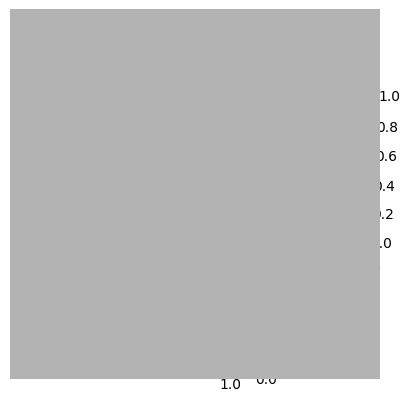

In [ ]:
from stl import mesh
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt

# Create a new plot
figure = plt.figure()
axes = figure.add_subplot(projection='3d')

# Load the STL files and add the vectors to the plot
#your_mesh = mesh.Mesh.from_file(r'')
poly_collection = mplot3d.art3d.Poly3DCollection(your_mesh.vectors)
poly_collection.set_color((0.7,0.7,0.7))  # play with color
axes.add_collection3d(poly_collection)

# Show the plot to the screen
plt.show()

In [ ]:
!pip install numpy-stl

In [ ]:
from stl import mesh
import numpy as np

# Download the STL file
import urllib.request
url = "https://raw.githubusercontent.com/BabylonJS/MeshesLibrary/master/Channel9/Channel9.stl"
file_path = "Channel9.stl"
urllib.request.urlretrieve(url, file_path)

# Load the STL file
your_mesh = mesh.Mesh.from_file(file_path)

# Access vertices and manipulate
print(f"Loaded mesh: {your_mesh}")
print(f"Number of faces: {len(your_mesh)}")
print(f"Volume: {your_mesh.get_mass_properties()[0]}")
from stl import mesh
import numpy as np

# Download the STL file




Loaded mesh: <Mesh: b'Exported from Blender-2.74 (sub 0)' 5912 vertices>
Number of faces: 5912
Volume: 139588.66894748923
Loaded mesh: <Mesh: b'Exported from Blender-2.74 (sub 0)' 5912 vertices>
Number of faces: 5912
Volume: 139588.66894748923


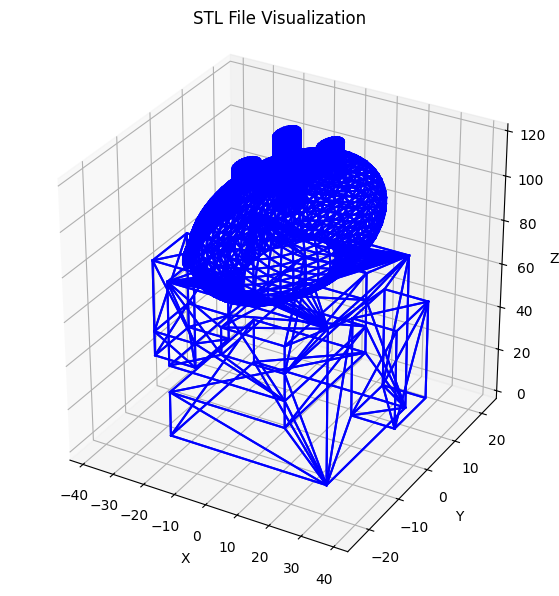

In [ ]:
from stl import mesh
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import urllib.request

# Download the STL file
url = "https://raw.githubusercontent.com/BabylonJS/MeshesLibrary/master/Channel9/Channel9.stl"
file_path = "Channel9.stl"
urllib.request.urlretrieve(url, file_path)

# Load the STL file
your_mesh = mesh.Mesh.from_file(file_path)

# Create a 3D plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Add the mesh to the plot
for segment in your_mesh.vectors:
    # Draw each triangle
    x = [point[0] for point in segment]
    y = [point[1] for point in segment]
    z = [point[2] for point in segment]
    x.append(segment[0][0])  # Close the triangle
    y.append(segment[0][1])
    z.append(segment[0][2])
    ax.plot(x, y, z, color='b')

# Set plot labels and aspect
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_box_aspect([1, 1, 1])  # Equal aspect ratio

plt.title("STL File Visualization")
plt.show()


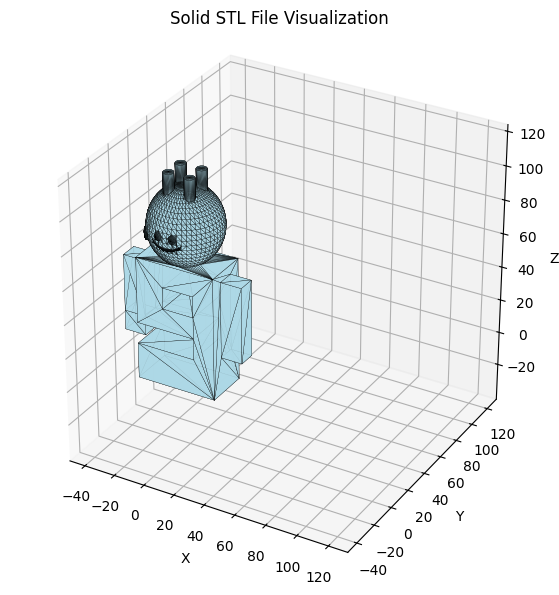

In [ ]:
from stl import mesh
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.pyplot as plt
import urllib.request

# Download the STL file
url = "https://raw.githubusercontent.com/BabylonJS/MeshesLibrary/master/Channel9/Channel9.stl"
file_path = "Channel9.stl"
urllib.request.urlretrieve(url, file_path)

# Load the STL file
your_mesh = mesh.Mesh.from_file(file_path)

# Create a 3D plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Create a collection of polygons from the mesh
poly3d = [triangle for triangle in your_mesh.vectors]
ax.add_collection3d(Poly3DCollection(poly3d, facecolors='lightblue', edgecolors='k', linewidths=0.2, alpha=0.9))

# Scale the plot to fit the STL model
scale = your_mesh.points.flatten()
ax.auto_scale_xyz(scale, scale, scale)

# Set plot labels and aspect ratio
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_box_aspect([1, 1, 1])  # Equal aspect ratio

plt.title("Solid STL File Visualization")
plt.show()


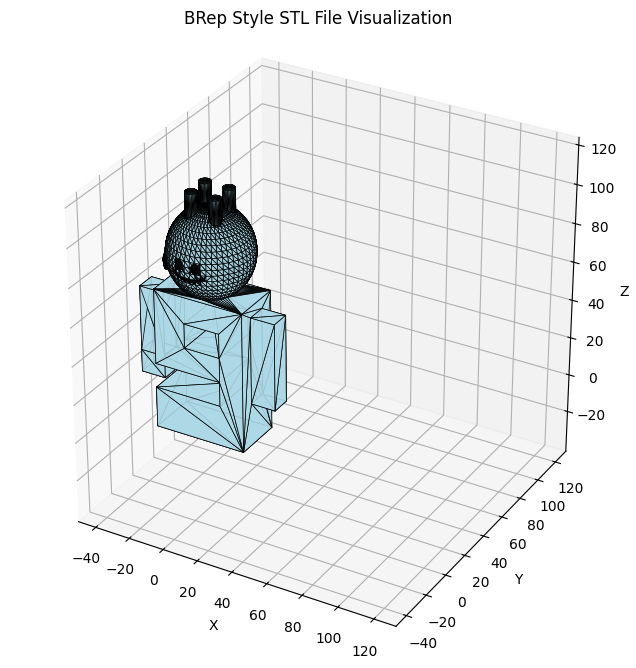

In [ ]:
from stl import mesh
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.pyplot as plt
import numpy as np
import urllib.request

# Download the STL file
url = "https://raw.githubusercontent.com/BabylonJS/MeshesLibrary/master/Channel9/Channel9.stl"
file_path = "Channel9.stl"
urllib.request.urlretrieve(url, file_path)

# Load the STL file
your_mesh = mesh.Mesh.from_file(file_path)

# Create a 3D plot
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Create a collection of polygons for the solid surface
poly3d = [triangle for triangle in your_mesh.vectors]
surface = Poly3DCollection(poly3d, facecolors='lightblue', edgecolors='k', linewidths=0.5, alpha=0.9)
ax.add_collection3d(surface)

# Overlay wireframe edges
for segment in your_mesh.vectors:
    x = [point[0] for point in segment] + [segment[0][0]]
    y = [point[1] for point in segment] + [segment[0][1]]
    z = [point[2] for point in segment] + [segment[0][2]]
    ax.plot(x, y, z, color='k', linewidth=0.3)

# Scale the plot to fit the STL model
scale = your_mesh.points.flatten()
ax.auto_scale_xyz(scale, scale, scale)

# Set plot labels and aspect ratio
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_box_aspect([1, 1, 1])  # Equal aspect ratio

plt.title("BRep Style STL File Visualization")
plt.show()


In [ ]:
!pip install pyvista numpy-stl

import pyvista as pv
from stl import mesh
import urllib.request
import numpy as np


# Download the STL file
url = "https://raw.githubusercontent.com/BabylonJS/MeshesLibrary/master/Channel9/Channel9.stl"
file_path = "Channel9.stl"
urllib.request.urlretrieve(url, file_path)

# Load the STL file
your_mesh = mesh.Mesh.from_file(file_path)

# Extract vertices and faces
vertices = your_mesh.vectors.reshape(-1, 3)
faces = np.arange(len(vertices)).reshape(-1, 3)

# Create a PyVista mesh
pv_mesh = pv.PolyData(vertices, faces)

# Add a plotter
plotter = pv.Plotter()
plotter.add_mesh(pv_mesh, color="lightblue", show_edges=True, edge_color="black", line_width=1, opacity=1.0)

# Set view parameters
plotter.add_axes()
plotter.show_grid()
plotter.show(title="Interactive BRep Style Visualization")


CellSizeError: `faces` cell array size is invalid.

In [ ]:
import pyvista as pv
from stl import mesh
import urllib.request
import numpy as np


# Download the STL file
url = "https://raw.githubusercontent.com/BabylonJS/MeshesLibrary/master/Channel9/Channel9.stl"
file_path = "Channel9.stl"
urllib.request.urlretrieve(url, file_path)

# Load the STL file
your_mesh = mesh.Mesh.from_file(file_path)

# Extract vertices and faces
vertices = your_mesh.vectors.reshape(-1, 3)
# Correctly construct the faces array
faces = np.hstack([np.full((your_mesh.vectors.shape[0], 1), 3), your_mesh.vectors.reshape(-1, 3, 3).reshape(-1, 9)[:,:3]]) #  3 + vertex indices for triangles

# Create a PyVista mesh
pv_mesh = pv.PolyData(vertices, faces)

# Add a plotter
plotter = pv.Plotter()
plotter.add_mesh(pv_mesh, color="lightblue", show_edges=True, edge_color="black", line_width=1, opacity=1.0)

# Set view parameters
plotter.add_axes()
plotter.show_grid()
plotter.show(title="Interactive BRep Style Visualization")

TypeError: Indices must be either a mask or an integer array-like

In [ ]:
!pip install open3d

import open3d as o3d

# Import mesh (stl/obj/...)
mesh = o3d.io.read_triangle_mesh("Part9.stl")
print(mesh)

# Show 3D model
mesh.compute_vertex_normals()
o3d.visualization.draw_geometries([mesh])


[Open3D WARNING] Unable to load file Part9.stl with ASSIMP
TriangleMesh with 0 points and 0 triangles.
[Open3D WARNING] GLFW Error: X11: The DISPLAY environment variable is missing
[Open3D WARNING] Failed to initialize GLFW
[Open3D WARNING] [DrawGeometries] Failed creating OpenGL window.


In [ ]:
import k3d

vertices = [
    -10, 0, -1,
    10, 0, -1,
    10, 0, 1,
    -10, 0, 1,
]

indices = [
    0, 1, 3,
    1, 2, 3
]

plot = k3d.plot()
plot += k3d.mesh(vertices, indices)
plot.display()

Output()

In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

Support for third party widgets will remain active for the duration of the session. To disable support:

In [ ]:
from google.colab import output
output.disable_custom_widget_manager()

In [ ]:
# Install necessary libraries
!pip install numpy-stl pythreejs

# Import necessary libraries
from stl import mesh
from pythreejs import *
import numpy as np
from IPython.display import display

!wget https://raw.githubusercontent.com/Buildbee/example-stl/main/ascii-cube.stl


# Load the STL file
your_mesh = mesh.Mesh.from_file('ascii-cube.stl')

# Extract vertices and faces
vertices = np.array(your_mesh.vectors.reshape(-1, 3))
faces = np.arange(len(vertices)).reshape(-1, 3)

# Cre# Convert to BufferGeometry
geometry = BufferGeometry(
    attributes={
        'position': BufferAttribute(vertices, normalized=False)
    }
)

material = MeshStandardMaterial({"color":0xff0000})

# Create mesh
mesh = Mesh(geometry=geometry, material=material)

# Set up the scene
scene = Scene(children=[mesh, AmbientLight(color='#777777')])
camera = PerspectiveCamera(position=[5, 5, 5], fov=20)
controller = OrbitControls(controlling=camera)

# Render the object
renderer = Renderer(camera=camera, scene=scene, controls=[controller], width=800, height=600)
display(renderer)


--2024-12-26 21:43:54--  https://raw.githubusercontent.com/Buildbee/example-stl/main/ascii-cube.stl
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1377 (1.3K) [text/plain]
Saving to: ‘ascii-cube.stl.6’

ascii-cube.stl.6    100%[===================>]   1.34K  --.-KB/s    in 0s      

2024-12-26 21:43:54 (80.3 MB/s) - ‘ascii-cube.stl.6’ saved [1377/1377]



TypeError: Material.__init__() takes 1 positional argument but 2 were given

In [ ]:
!pip install trimesh pythreejs

import trimesh
from pythreejs import *

# Load STL file using trimesh
mesh = trimesh.load('ascii-cube.stl')

# Extract vertices and faces
geometry = BufferGeometry(
    attributes={
        "position": BufferAttribute(np.array(mesh.vertices, dtype=np.float32)),
        "index": BufferAttribute(np.array(mesh.faces.flatten(), dtype=np.uint32)),
    }
)

# Create a mesh and add to the scene
material = MeshStandardMaterial(color='gray')
mesh = Mesh(geometry, material)
scene = Scene()
scene.add(mesh)

display(renderer)


NameError: name 'renderer' is not defined